In [2]:
import os, sys
import pandas as pd
from pandas import DataFrame
import numpy as np
from IPython.display import HTML, Image
import re

In [3]:
from test_partitions import get_last_testdir, set_test_dir, calc_scores, gather_outputs

In [4]:
# %load_ext autoreload
# %autoreload 2

In [5]:
if "testResults" not in os.listdir(os.curdir):
    rootdir = os.path.abspath("..")
    os.chdir(rootdir)
    set_test_dir(True)

In [6]:
scores_df = calc_scores()

Scores saved to testResults/ptest_2023-11-9_11-0-18/scores.csv


In [7]:
def highlight_min(s: pd.Series):
    sorted = s.sort_values(ascending=True)    
    styles = []
    for val in s:
        if val == sorted.iloc[0]:
            styles.append('background: darkgreen')
        elif val == sorted.iloc[1]:
            styles.append('background: darkblue')
        elif val == sorted.iloc[-1]:
            styles.append('background: #330000')
        else:
            styles.append('')
          
    return styles

scores_df_s = scores_df.iloc[:, :7]

# scores_df_s["namee"] = scores_df_s.name.apply(lambda x: x.split("V:")[0].strip())
# scores_df_s["namev"] = scores_df_s.name.apply(lambda x: "V:" + x.split("V:")[1].strip())
# scores_df_s = scores_df_s.drop(columns=["name"])

# scores_df_s = pd.merge(scores_df_s[["namee", "namev"]], scores_df_s.drop(columns=["namee", "namev"]), left_index=True, right_index=True)

scores_df_s.style.apply(
    highlight_min,
    subset=list(filter(lambda x: not x.startswith("name"), scores_df_s.columns)), 
    axis=0,
)

,name,vnum_std,vnum_max_diff,stime_std,stime_max,ctime_std,ctime_max
id,,,,,,,
0,E: V:,15.648047,48.500320,0.724744,2.993000,1.951881,6.326000
1,E: V: connections,13.967368,40.672417,0.542127,2.622000,1.032693,5.011000
2,E: V: connexp,10.990602,30.665551,0.451051,1.992000,1.990780,6.869000
3,"E: V: connections,connexp",10.928834,30.566215,0.462910,2.036000,2.029164,6.790000
4,E: route-num V:,17.511598,52.591323,0.693053,2.815000,1.399338,5.986000
5,E: route-num V: connections,8.291724,23.862757,0.319131,1.808000,2.644046,8.755000
6,E: route-num V: connexp,11.936464,34.825613,0.624737,2.325000,2.158553,7.300000
7,"E: route-num V: connections,connexp",11.082063,32.297649,0.613970,2.280000,2.245199,7.343000
8,E: osm V:,16.708024,47.745683,0.683565,2.651000,1.383415,4.305000


In [39]:
def highlight_min(s: pd.Series):
    sorted = s.sort_values(ascending=True)    
    styles = []
    for val in s:
        if val == sorted.iloc[0]:
            styles.append('cellcolor: {green}')
        # elif val == sorted.iloc[1]:
        #     styles.append('cellcolor: {lightblue}')
        elif val == sorted.iloc[-1]:
            styles.append('cellcolor: {red}')
        else:
            styles.append('')
          
    return styles

def makecell(s: str):
    return "\\makecell{" + s.replace("\n", "\\\\") + "}"

dft = scores_df_s.rename(
    columns={
        "name": "Weights used (Edges and Vertices)",
        "vnum_std": makecell("V.num\n$\sigma$"),
        "vnum_max_diff": makecell("V.num\nmax diff."),
        "stime_std": makecell("sim.\n$t$\space$\sigma$"),
        "stime_max": makecell("sim.\n$t$ max"),
        "ctime_std": makecell("comm.\n$t$\space$\sigma$"),
        "ctime_max": makecell("comm.\n$t$ max"),
    }
).reset_index(drop=True).round(2)

styler = dft.style.apply(
    highlight_min,
    subset=list(filter(lambda x: "Weights" not in x, dft.columns)), 
    axis=0,
).map_index(lambda v: "bfseries: ;", axis="columns"
).format(precision=2
).hide(axis="index"
)
styler.to_latex(
    "../elaborato/chap4_results_table.tex",
    hrules=True,
    siunitx=True,
    clines="all;data",
)
styler

Weights used (Edges and Vertices),\makecell{V.num\\$\sigma$},\makecell{V.num\\max diff.},\makecell{sim.\\$t$\space$\sigma$},\makecell{sim.\\$t$ max},\makecell{comm.\\$t$\space$\sigma$},\makecell{comm.\\$t$ max}
E: V:,15.65,48.50,0.72,2.99,1.95,6.33
E: V: connections,13.97,40.67,0.54,2.62,1.03,5.01
E: V: connexp,10.99,30.67,0.45,1.99,1.99,6.87
"E: V: connections,connexp",10.93,30.57,0.46,2.04,2.03,6.79
E: route-num V:,17.51,52.59,0.69,2.82,1.40,5.99
E: route-num V: connections,8.29,23.86,0.32,1.81,2.64,8.76
E: route-num V: connexp,11.94,34.83,0.62,2.33,2.16,7.30
"E: route-num V: connections,connexp",11.08,32.30,0.61,2.28,2.25,7.34
E: osm V:,16.71,47.75,0.68,2.65,1.38,4.30
E: osm V: connections,12.47,36.36,0.54,1.91,1.57,5.62


In [9]:
select = 5

In [10]:
test_dir = os.path.join("testResults", get_last_testdir())
seldir = os.path.join(test_dir, [dirn for dirn in os.listdir(test_dir) if re.sub(r'^0+', '', dirn).startswith(str(select))][0])
results_file = os.path.join(seldir, "output.html")

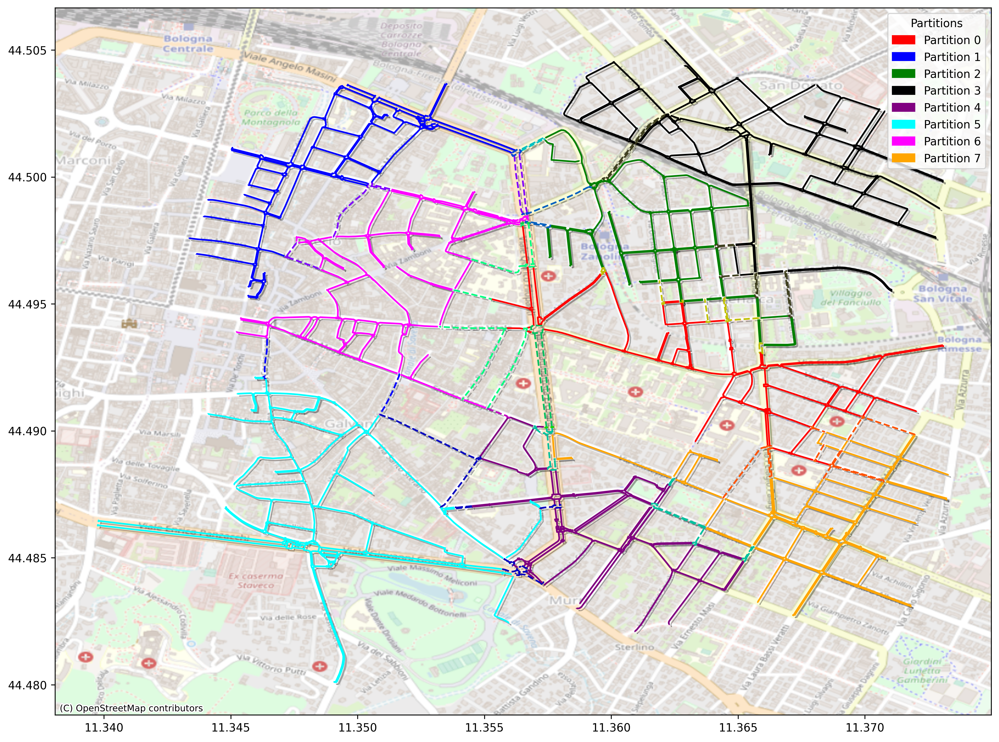

In [11]:
# from urllib.parse import quote

# with open(results_file, 'r') as f:
#     content = f.read()
#     content = content.replace('"./', f'"{quote(seldir)}/')
    # display(HTML(content))
    
Image(os.path.join(seldir, "partitions.png"))

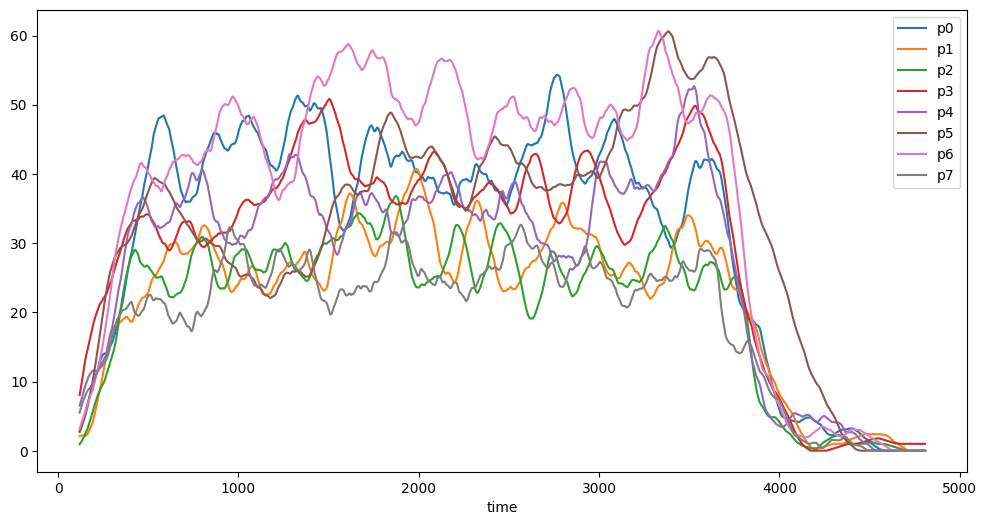

In [12]:
display(Image(os.path.join(seldir, "allStepVehicles.png")))

In [13]:
# test_dir = os.path.join("testResults", get_last_testdir())
# subdirs = [f for f in os.listdir(test_dir) if os.path.isdir(os.path.join(test_dir, f))]
# dirname = subdirs[0]
# dirpath = os.path.join(test_dir, dirname)

# msgnum_df = pd.read_csv(os.path.join(dirpath, "msgNum.csv"), index_col="time")
# msgnum_df_in = msgnum_df[filter(lambda x: x.endswith("_in"), msgnum_df.columns)].rename(columns=lambda x: x.replace("_in", ""))
# msgnum_df_out = msgnum_df[filter(lambda x: x.endswith("_out"), msgnum_df.columns)].rename(columns=lambda x: x.replace("_out", ""))
# msgnum_df_tot = msgnum_df_in + msgnum_df_out
# avg_devtn_msgnum = msgnum_df.std(axis=1)

# msgnum_df_in.sum()